# Cross technology alignment
In this tutorial, we will show how to use `SLAT` to align spatial dataset from different technologies: 10x Xenium ([Amanda. et al](https://www.biorxiv.org/content/10.1101/2022.10.06.510405v1)) and 10x Visium, which are two complementary spatial technologies. Xenium allows spatially resolving cell types with subcellular resolution but limited in pre-designed gene, while Visium can profile whole picture of transcriptome but lack enough resolution to reveal single cell identity.

You need following files as input:

 * xenium.h5ad: Xenium dataset, download data from [here](https://drive.google.com/file/d/1-xQSVKHEwVosFasV1urJNwHu70x6me6J/view?usp=drive_link) 
 * visium.h5ad: Visium dataset, download data from [here](https://drive.google.com/file/d/1DKeEcOf2ovSslciaNBsNMTlbrCrkJ60R/view?usp=drive_link)
 * TP_Xenium_index.csv: Annotation of triple positive cells in Xenium dataset, download from [here](https://drive.google.com/uc?export=download&id=1Ifhf2UJPklzb-xAJHDDLphar18lb9aIq)
 * TP.csv: (Optional) Annotation of triple positive cells in Visium dataset, just for comparing, download from [here](https://drive.google.com/uc?export=download&id=1zzH9aKPj7ozsjFDAOAiI3YaSlJi2gatb)

In [1]:
import os
import scanpy as sc
import numpy as np
import pandas as pd
import faiss

import matplotlib.pyplot as plt
from matplotlib_venn import venn2
import seaborn as sns

import scSLAT
from scSLAT.model import Cal_Spatial_Net, load_anndatas, run_SLAT, spatial_match
from scSLAT.viz import match_3D_multi, hist, Sankey
from scSLAT.metrics import region_statistics

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-kwsqmcvy because the default path (/home/xiacr/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=150, frameon=True, vector_friendly=True, fontsize=14)

In [3]:
adata1 = sc.read_h5ad('xenium.h5ad')
adata2 = sc.read_h5ad('visium.h5ad')

In [4]:
adata1.layers['counts'] = adata1.X.copy()
adata2.layers['counts'] = adata2.X.copy()

## Check marker genes
We check expression of marker genes *ERBB2, PGR, ESR1* of triple positive breast tumor in two slices respectively. And we find Xenium have much higher resolution than Visium.
We can find a region enriched triple positive breast tumor cells in Xenium clearly, but it only corresponding a few spots in Visium, which may be neglected easily.

So we decided to use `SLAT` to align two slices and define triple positive breast tumor in Visium.

In [5]:
sc.pp.log1p(adata1)
sc.pp.log1p(adata2)

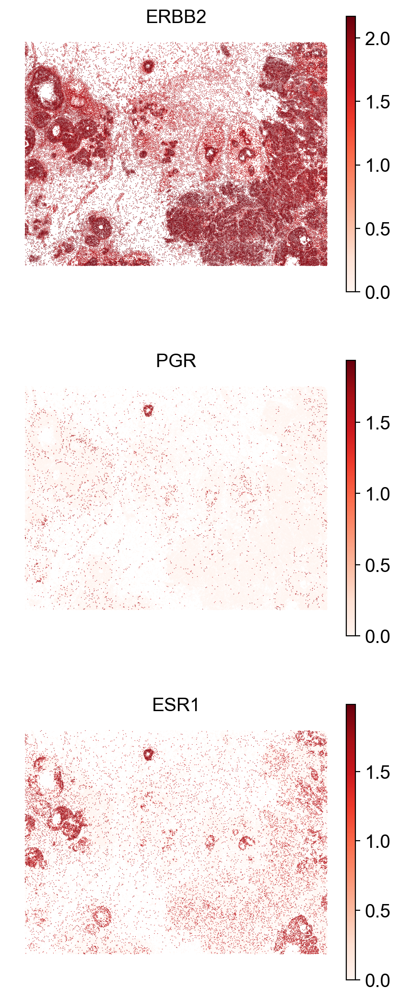

In [8]:
sc.pl.spatial(adata1, color=['ERBB2','PGR','ESR1'], ncols=1, spot_size=15, color_map='Reds', legend_fontsize='small', frameon=False)

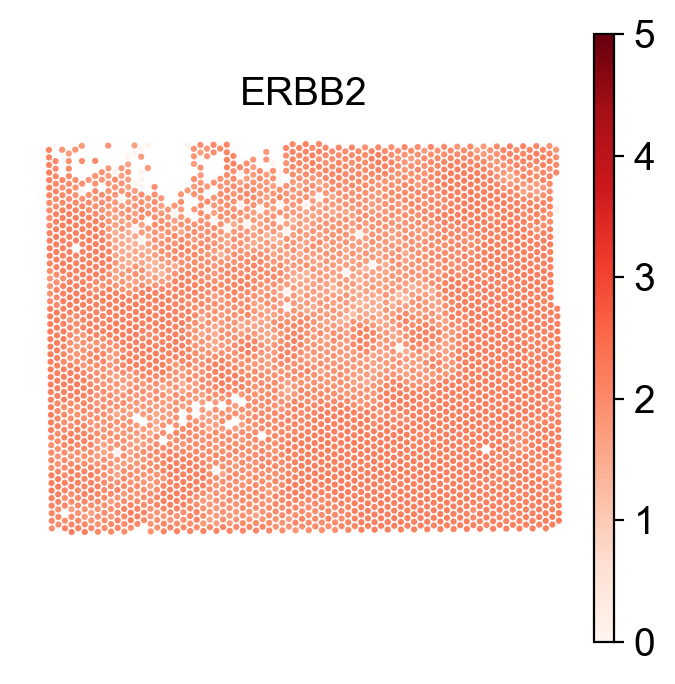

In [6]:
sc.pl.spatial(adata2, color=['ERBB2'], ncols=1, spot_size=150, color_map='Reds', legend_fontsize='small', vmin=0, vmax=5, frameon=False)

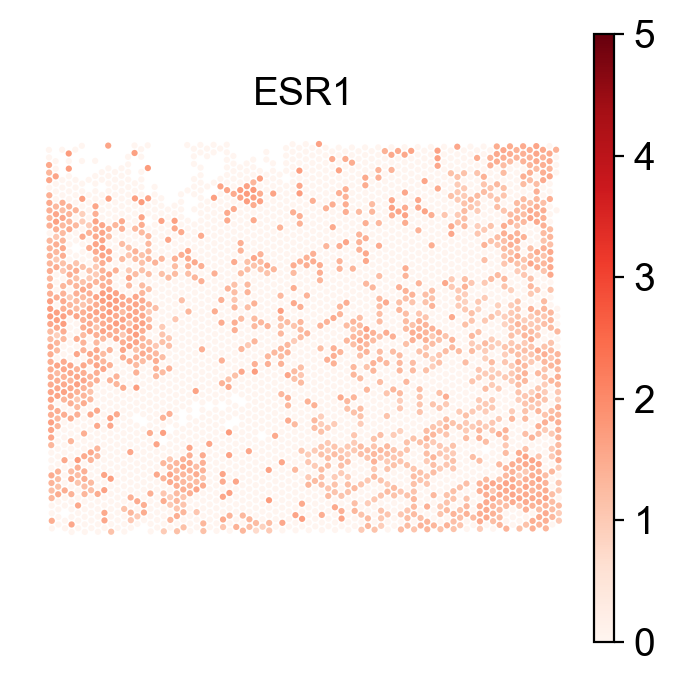

In [7]:
sc.pl.spatial(adata2, color=['ESR1'], ncols=1, spot_size=150, color_map='Reds', legend_fontsize='small', vmin=0, vmax=5, frameon=False)

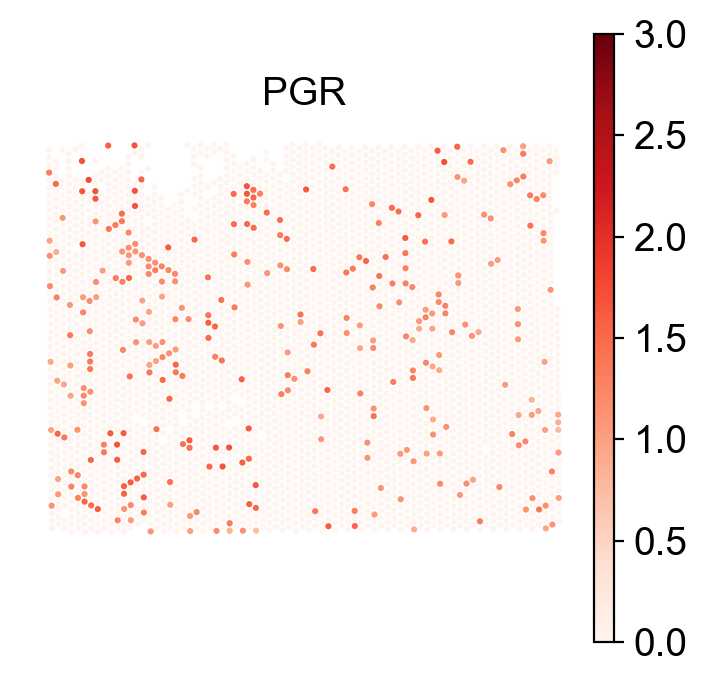

In [11]:
sc.pl.spatial(adata2, color=['PGR'], ncols=1, spot_size=150, color_map='Reds', legend_fontsize='small', vmin=0, vmax=3, frameon=False)

Here we load the manually labeled triple positive cells in Xenium dataset

/tmp/ipykernel_3210214/3873682155.py:1: DeprecationWarning: loadtxt(): Parsing an integer via a float is deprecated.  To avoid this warning, you can:
    * make sure the original data is stored as integers.
    * use the `converters=` keyword argument.  If you only use
      NumPy 1.23 or later, `converters=float` will normally work.
    * Use `np.loadtxt(...).astype(np.int64)` parsing the file as
      floating point and then convert it.  (On all NumPy versions.)
  (Deprecated NumPy 1.23)
  TP_Xenium_index = np.loadtxt('./TP_Xenium_index.csv', dtype=np.int64)


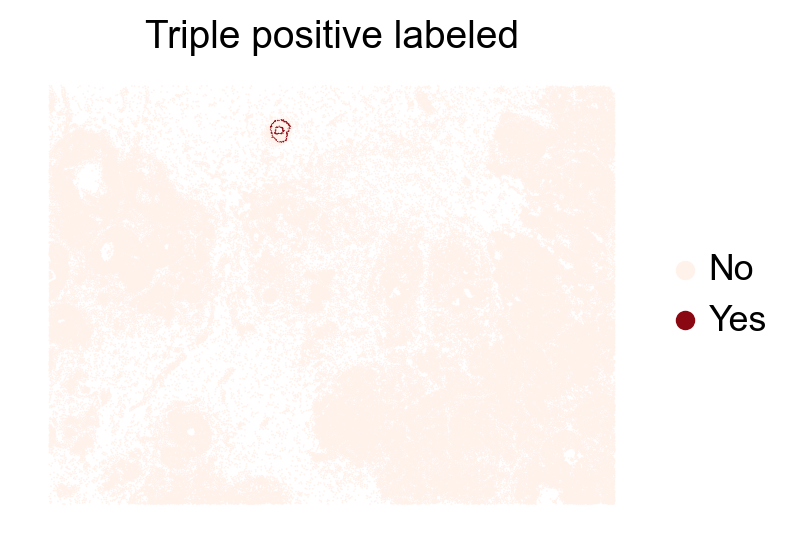

In [8]:
TP_Xenium_index = np.loadtxt('./TP_Xenium_index.csv', dtype=np.int64)
adata1.obs['TP'] = 'No'
adata1.obs.iloc[TP_Xenium_index, adata1.obs.columns.get_loc('TP')] = 'Yes'
sc.pl.spatial(adata1, color='TP', spot_size=20, title='Triple positive labeled', palette=['#fff2eb','#8A0812'], frameon=False)

In [10]:
adata1.X = adata1.layers['counts']
adata2.X = adata2.layers['counts']

## Run SLAT
**Note**: we set different size of *k* to ensure that two GCNs have similar receptive fields in spatial

In [11]:
Cal_Spatial_Net(adata1, k_cutoff=120, model='KNN')
Cal_Spatial_Net(adata2, k_cutoff=5, model='KNN')

Calculating spatial neighbor graph ...
The graph contains 13226912 edges, 100642 cells.
131.4253691301842 neighbors per cell on average.
Calculating spatial neighbor graph ...
The graph contains 20683 edges, 3841 cells.
5.384795626139026 neighbors per cell on average.


In [12]:
edges, features = load_anndatas([adata1, adata2], feature='DPCA')
embd0, embd1, time = run_SLAT(features, edges, LGCN_layer=3, hidden_size=4096)

Use DPCA feature to format graph


/rd1/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(
/rd1/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:61: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/rd1/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/rd1/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/rd1/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarn

Warning! Dual PCA is using GPU, which may lead to OUT OF GPU MEMORY in big dataset!
Choose GPU:2 as device
Running
---------- epochs: 1 ----------
---------- epochs: 2 ----------
---------- epochs: 3 ----------
---------- epochs: 4 ----------
---------- epochs: 5 ----------
---------- epochs: 6 ----------
Training model time: 8.67


In [13]:
best, index, distance = spatial_match(features[::-1], adatas=[adata2,adata1], reorder=False, top_n=200, smooth_range=200)

In [14]:
adata1_df = pd.DataFrame({'index': range(embd0.shape[0]),
                        'x': adata1.obsm['spatial'][:,0],
                        'y': adata1.obsm['spatial'][:,1],
                        'leiden':adata1.obs['leiden']})
adata2_df = pd.DataFrame({'index': range(embd1.shape[0]),
                        'x': adata2.obsm['spatial'][:,0],
                        'y': adata2.obsm['spatial'][:,1],
                        'leiden':adata2.obs['leiden']})

matching = np.array([range(index.shape[0]), best])
best_match = distance[:,0]

## Visualize alignment

dataset1: 11 cell types; dataset2: 11 cell types; 
                    Total :11 celltypes; Overlap: 11 cell types 
                    Not overlap :[[]]
Subsample 300 cell pairs from 100642


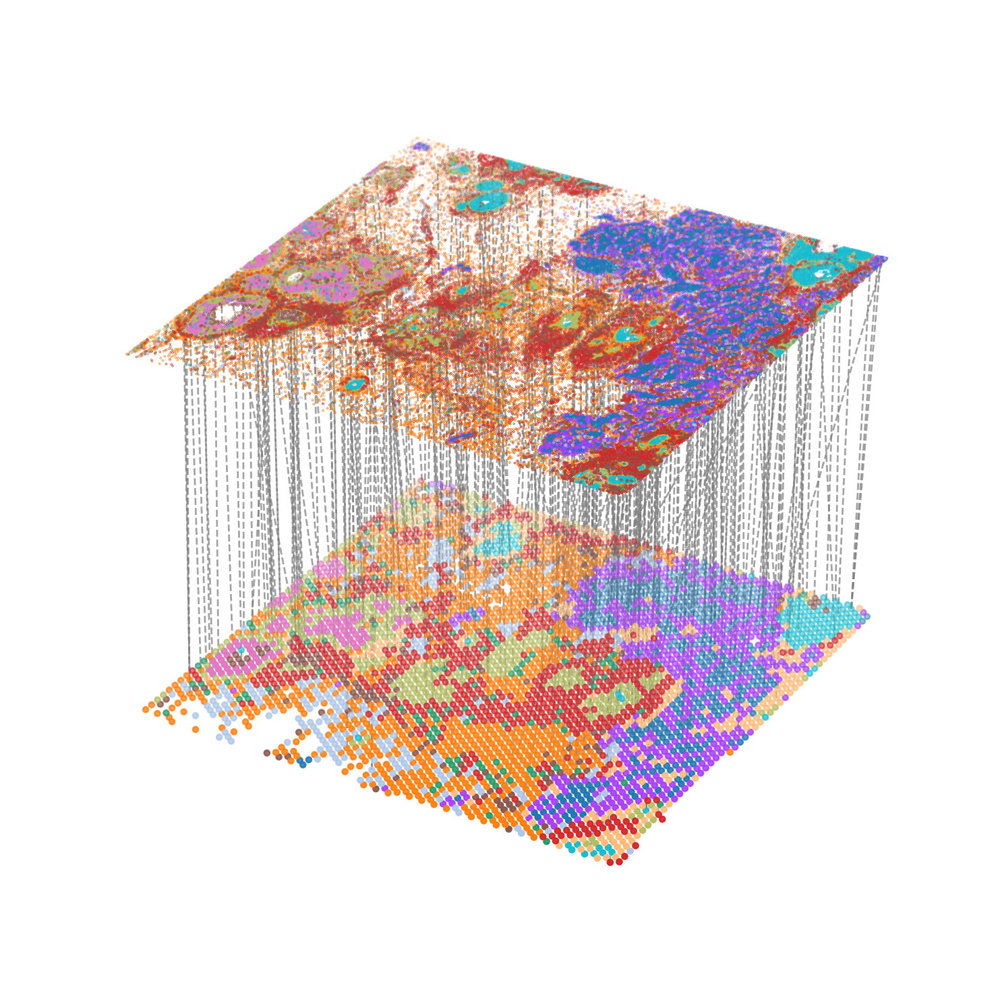

In [15]:
multi_align = match_3D_multi(adata2_df, adata1_df, matching, meta='leiden',
                            scale_coordinate=True, subsample_size=300)

multi_align.draw_3D(size=[13, 9.5], line_width=1 ,point_size=[8,0.1], show_error=False, hide_axis=True)

We can also highlight the subset of triple positive cells in aligned Visium dataset

dataset1: 11 cell types; dataset2: 11 cell types; 
                    Total :11 celltypes; Overlap: 11 cell types 
                    Not overlap :[[]]
Subsample 10 cell pairs from 94


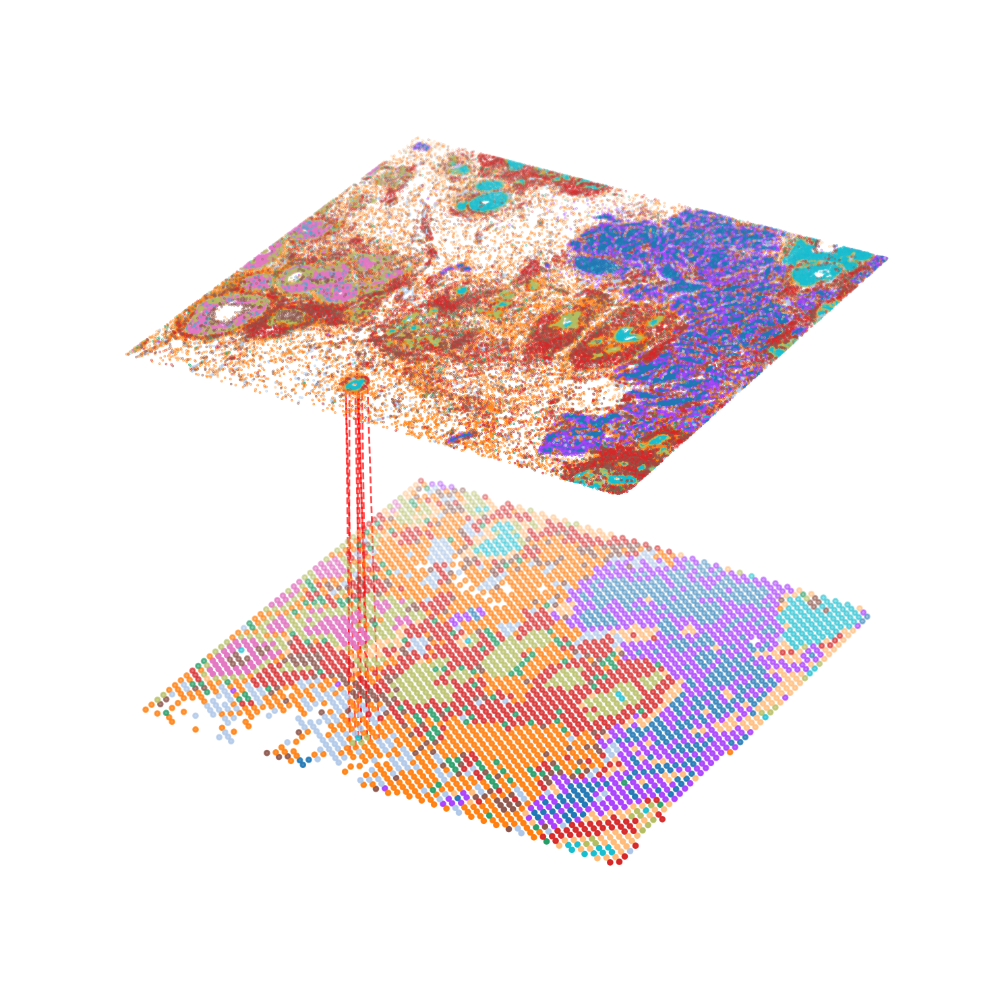

In [16]:
multi_align = match_3D_multi(adata2_df, adata1_df, matching,meta='leiden',
                            scale_coordinate=True, subsample_size=10, subset=TP_Xenium_index)

multi_align.draw_3D(size=[13, 9.5], line_width=1 ,point_size=[6,0.1], show_error=False, hide_axis=True, line_color='red')

Then we show the expression of *PGR* in alignment result.

In [17]:
adata1_df['PGR'] = sc.get.obs_df(adata1, 'PGR').values
adata2_df['PGR'] = sc.get.obs_df(adata2, 'PGR').values

dataset1: 11 cell types; dataset2: 11 cell types; 
                    Total :11 celltypes; Overlap: 11 cell types 
                    Not overlap :[[]]
Subsample 10 cell pairs from 94


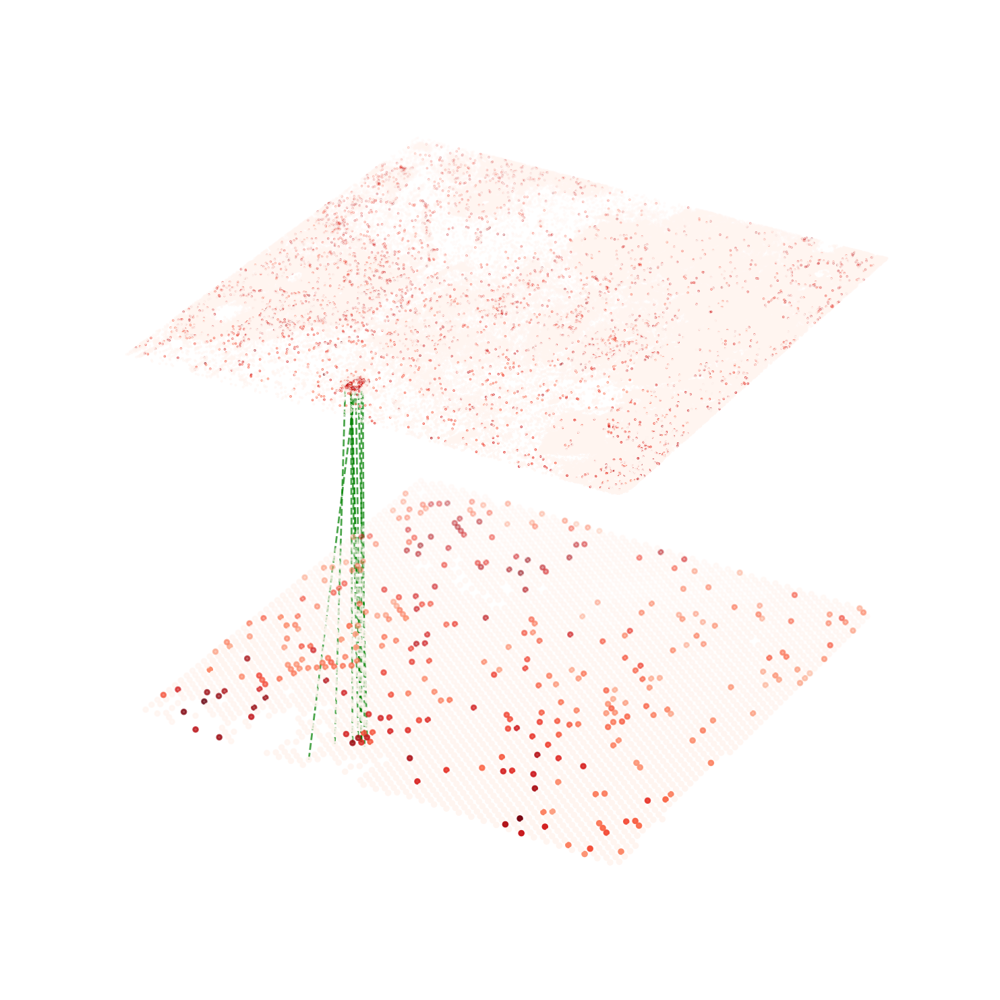

In [18]:
multi_align = match_3D_multi(adata2_df, adata1_df, matching, meta='leiden', expr='PGR',
                            scale_coordinate=True, subsample_size=10, subset=TP_Xenium_index)

multi_align.draw_3D(size=[13, 9.5], line_width=1 ,point_size=[6, 0.1], show_error=False, hide_axis=True, line_color='green')

## Check alignment results in Visium

Since the number of cells in Xenium is much more than Visium (about 20 times), we use a voting strategy to select the corresponding spot in Visium.

In [19]:
TP_matching = matching[:,TP_Xenium_index]

In [20]:
unique_elements, frequency = np.unique(TP_matching[1,:], return_counts=True)
sorted_indexes = np.argsort(frequency)[::-1]
sorted_by_freq = unique_elements[sorted_indexes]

In [21]:
adata2.obs['TP_score'] = 0
for target, score in zip(sorted_by_freq ,np.sort(frequency)[::-1]):
    adata2.obs.iloc[target,:]['TP_score'] = score

/tmp/ipykernel_3210214/1016166785.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata2.obs.iloc[target,:]['TP_score'] = score


In [22]:
adata2.obs.iloc[sorted_by_freq, -1] = np.sort(frequency)[::-1]

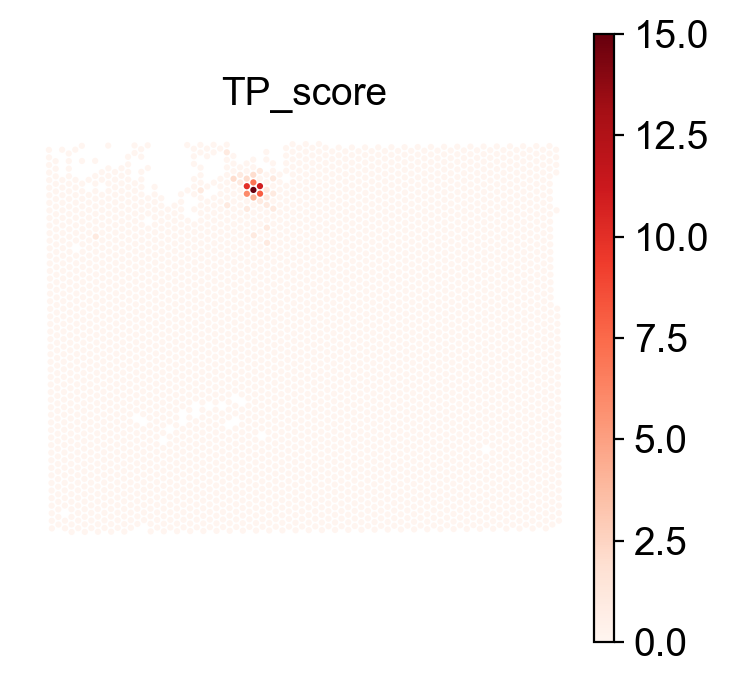

In [23]:
sc.pl.spatial(adata2, color='TP_score', spot_size=150, cmap='Reds', vmax=15, frameon=False)

In [24]:
sorted_by_freq_filter = sorted_by_freq[:7]

In [25]:
TP_align_barcode = adata2.obs.index[sorted_by_freq_filter]

In [26]:
adata2.obs['TP_align'] = 'No'
adata2.obs.loc[adata2.obs.index.isin(TP_align_barcode), 'TP_align'] = 'Yes'

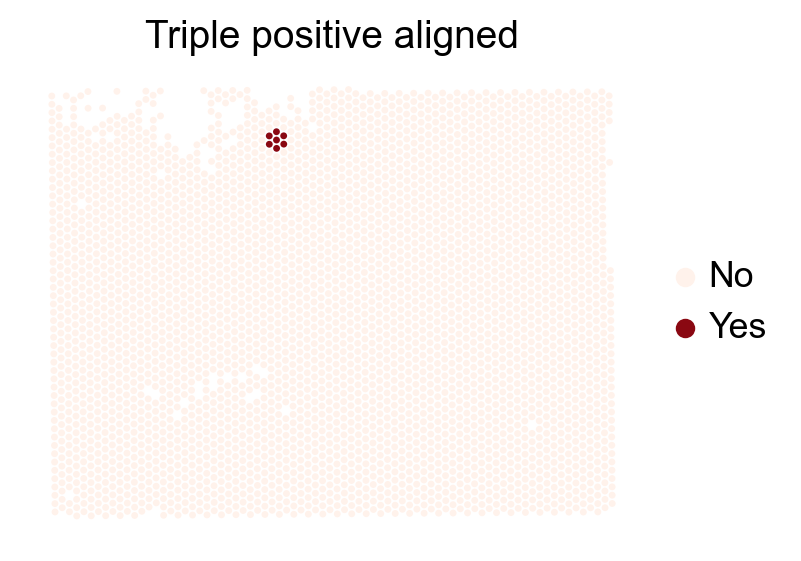

In [27]:
sc.pl.spatial(adata2, color='TP_align', spot_size=150, title='Triple positive aligned', palette=['#fff2eb','#8A0812'], frameon=False)

##   Compare with specialist annotation
Here we load the manually annotated results of triple positive cells in Visium dataset and compare it with SLAT alignment results

In [27]:
TP_barcode = pd.read_csv('../../data/visium/breast/TP.csv')
barcode2index = dict(zip(adata2.obs_names, range(adata2.shape[0])))
TP_index = TP_barcode['Barcode'].map(barcode2index).dropna()
TP_index = [int(i) for i in TP_index]

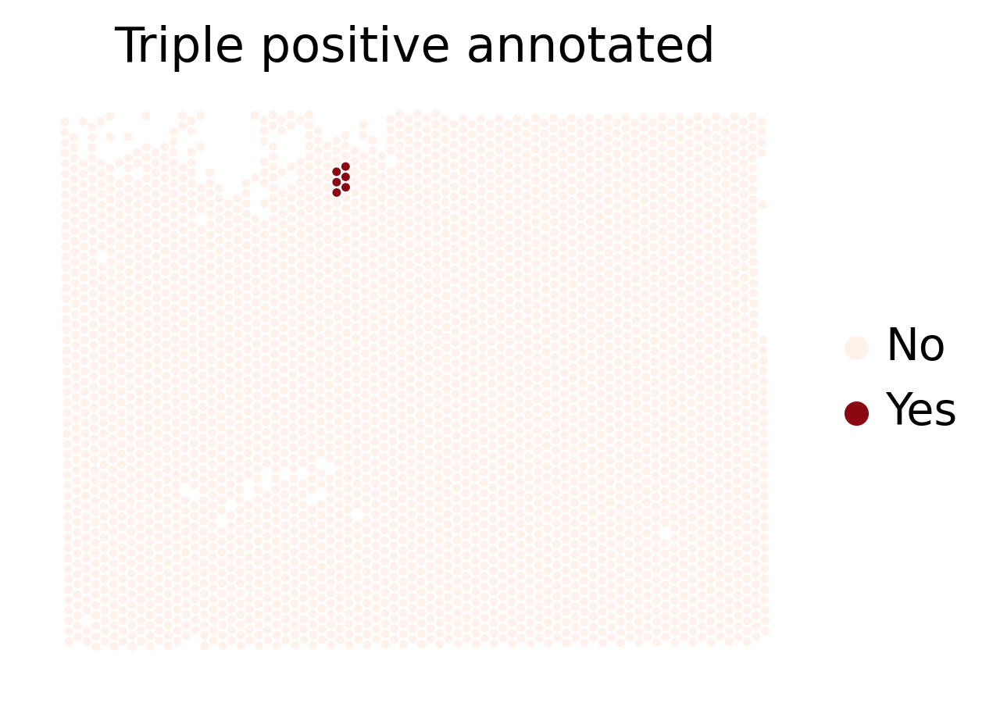

In [ ]:
adata2.obs['TP_anno'] = 'No'
adata2.obs.loc[adata2.obs_names.isin(TP_barcode['Barcode']), 'TP_anno'] = 'Yes'
sc.pl.spatial(adata2, color='TP_anno', spot_size=150, title='Triple positive annotated', palette=['#fff2eb','#8A0812'], frameon=False)

## Find DEGs
Considering limited gene coverage of Xenium, Visium is critical to derive whole transcriptome profiles from this triple positive region. We executed differential gene expression analysis of triple positive spots against all other spots.

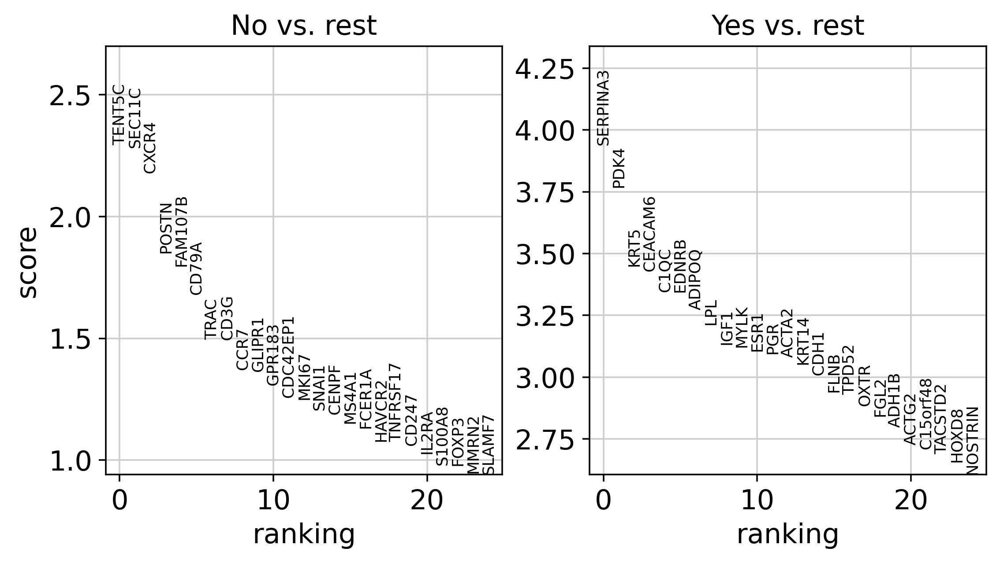

In [338]:
sc.tl.rank_genes_groups(adata2, 'TP_align', method='wilcoxon')
sc.pl.rank_genes_groups(adata2, n_genes=25, sharey=False)
result = adata2.uns['rank_genes_groups']
groups = result['names'].dtype.names
marker_TP_align = pd.DataFrame(
    {group + '_' + key[:4]: result[key][group]
    for group in groups for key in ['names', 'pvals','logfoldchanges','scores']}).head(25)

We then compared HVGs defined by SLAT alignment with that defined manual annotation, and find 23 of top 25 HVGs were overlapped with similar rank as well as fold change value.

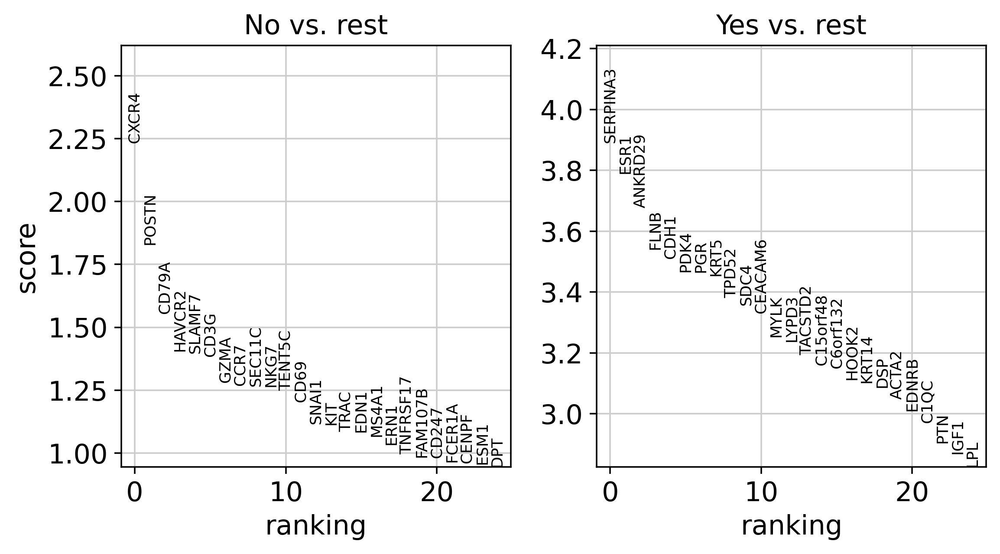

In [306]:
sc.tl.rank_genes_groups(adata2, 'TP_anno', method='wilcoxon')
sc.pl.rank_genes_groups(adata2, n_genes=25, sharey=False)
result = adata2.uns['rank_genes_groups']
groups = result['names'].dtype.names
marker_TP_anno = pd.DataFrame(
    {group + '_' + key[:4]: result[key][group]
    for group in groups for key in ['names', 'pvals','logfoldchanges','scores']}).head(25)